In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [3]:
filepath = "/home/boopro-prodesk-1/data/final_fcd.csv"
data2 = pd.read_csv(filepath, sep=",", names=["vehicle_fuel", "vehicle_speed", "vehicle_noise", "vehicle_NOx", "prediction"])
data2.head(10)

,vehicle_fuel,vehicle_speed,vehicle_noise,vehicle_NOx,prediction
0,837.22,0.00,55.94,1.20,2.352844
1,836.50,0.01,55.36,1.20,1.199678
2,814.53,6.47,60.26,1.00,0.872157
3,836.50,0.01,55.36,1.20,1.199678
4,2321.67,0.00,67.11,84.89,57.398065
5,4176.04,7.88,72.18,121.78,108.125583
6,837.22,0.00,55.94,1.20,2.352844
7,1249.50,7.86,63.53,1.60,1.775282
8,837.21,0.00,55.94,1.20,2.352844
9,837.22,0.00,55.94,1.20,2.352844


In [20]:
filepath = "/home/boopro-prodesk-1/data/final_emissions.csv"
data1 = pd.read_csv(filepath, sep=",", names=["vehicle_x", "vehicle_y", "congestion_cluster"])
data1

,vehicle_x,vehicle_y,congestion_cluster
0,2852.84,823.45,1
1,5978.01,1161.20,2
2,2852.84,823.45,1
3,4146.07,3115.33,0
4,4146.07,3115.33,0
...,...,...,...
12399,6174.12,3169.79,4
12400,4317.91,3016.38,0
12401,4519.44,2828.62,0
12402,4519.44,2828.62,0


In [13]:

# x1 = 0.26
# y1 = 14.01
# lat1 = 59.321926
# lon1 = 18.067417

# x2 = 116.30
# y2 = 109.42
# lat2 = 59.322828
# lon2 = 18.069380

# vehicle_x = data1["vehicle_x"]  
# vehicle_y = data1["vehicle_y"] 

# scale_factor_x = (lon2 - lon1) / (x2 - x1)
# scale_factor_y = (lat2 - lat1) / (y2 - y1)

# data1["lat"] = lat1 + (vehicle_y - y1) * scale_factor_y
# data1["lon"] = lon1 + (vehicle_x - x1) * scale_factor_x


x1, y1 = 1897.19, 2887.64
lat1, lon1 = 52.529167, 13.379135
x2, y2 = 3352.04, 2576.87
lat2, lon2 = 52.526666, 13.400674

def calculate_coefficients(x1, y1, lat1, lon1, x2, y2, lat2, lon2):
    a_lat = (lat2 - lat1) / (x2 - x1)
    b_lat = (lat2 - lat1) / (y2 - y1)
    
    a_lon = (lon2 - lon1) / (x2 - x1)
    b_lon = (lon2 - lon1) / (y2 - y1)
    
    return a_lat, b_lat, a_lon, b_lon

a_lat, b_lat, a_lon, b_lon = calculate_coefficients(x1, y1, lat1, lon1, x2, y2, lat2, lon2)

def xy_to_latlon(x, y, x1, y1, lat1, lon1, a_lat, b_lat, a_lon, b_lon):
    lat = lat1 + a_lat * (x - x1) + b_lat * (y - y1)
    lon = lon1 + a_lon * (x - x1) + b_lon * (y - y1)
    return lat, lon

vehicle_x = data1["vehicle_x"]  
vehicle_y = data1["vehicle_y"] 

lat, lon = xy_to_latlon(vehicle_x, vehicle_y, x1, y1, lat1, lon1, a_lat, b_lat, a_lon, b_lon)

data1["lat"] = lat
data1["lon"] = lon


print(data1)

       vehicle_x  vehicle_y  congestion_cluster        lat        lon  \
0        2852.84     823.45                   1  52.553677  14.282566   
1        5978.01    1161.20                   2  52.569018  15.273807   
2        2852.84     823.45                   1  52.553677  14.282566   
3        4146.07    3115.33                   0  52.657774  14.692752   
4        4146.07    3115.33                   0  52.657774  14.692752   
...          ...        ...                 ...        ...        ...   
12399    6174.12    3169.79                   4  52.660248  15.336009   
12400    4317.91    3016.38                   0  52.653280  14.747257   
12401    4519.44    2828.62                   0  52.644752  14.811178   
12402    4519.44    2828.62                   0  52.644752  14.811178   
12403    4127.75    3045.85                   0  52.654619  14.686942   

                        geometry  
0      POINT (59.32958 18.11567)  
1      POINT (59.33277 18.16854)  
2      POINT (59.3

In [14]:
data1 = gpd.GeoDataFrame(data1, geometry=gpd.points_from_xy(data1["lat"], data1["lon"]))
data1.head(10)

,vehicle_x,vehicle_y,congestion_cluster,lat,lon,geometry
0,2852.84,823.45,1,52.553677,14.282566,POINT (52.55368 14.28257)
1,5978.01,1161.20,2,52.569018,15.273807,POINT (52.56902 15.27381)
2,2852.84,823.45,1,52.553677,14.282566,POINT (52.55368 14.28257)
3,4146.07,3115.33,0,52.657774,14.692752,POINT (52.65777 14.69275)
4,4146.07,3115.33,0,52.657774,14.692752,POINT (52.65777 14.69275)
5,4031.68,2153.67,0,52.614096,14.656470,POINT (52.6141 14.65647)
6,4232.60,1794.80,0,52.597796,14.720198,POINT (52.5978 14.7202)
7,4395.55,1997.34,0,52.606995,14.771883,POINT (52.607 14.77188)
8,4232.60,1794.80,0,52.597796,14.720198,POINT (52.5978 14.7202)
9,5291.36,1287.24,2,52.574742,15.056016,POINT (52.57474 15.05602)


In [15]:
clusters = data1["congestion_cluster"].unique()
clusters

array([1, 2, 0, 3, 4])

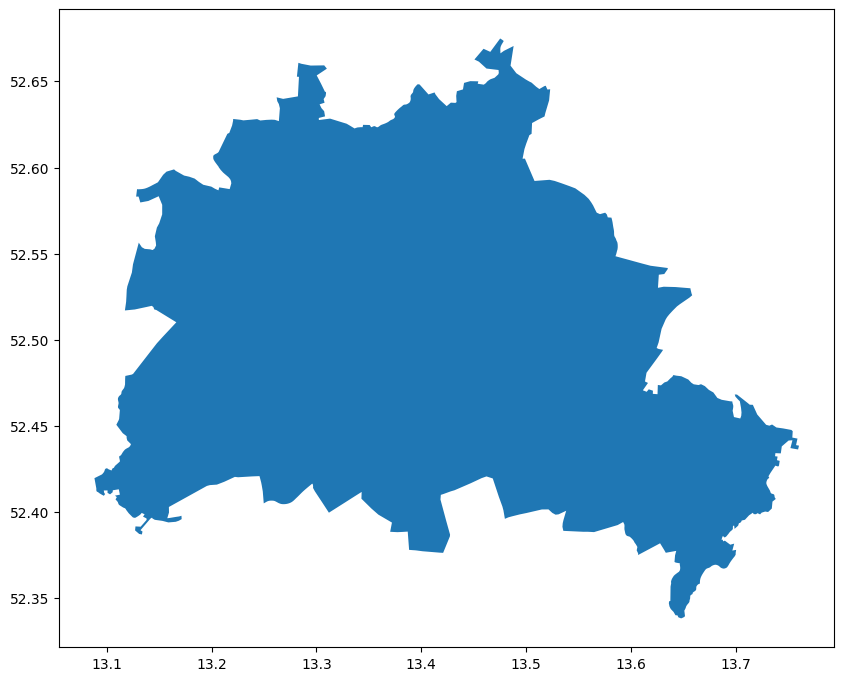

In [17]:
# world = gpd.read_file('./stockholm.geojson')
world = gpd.read_file('./Berlin.geojson')

world.head(10)
world.plot(figsize=(10, 10))
plt.show()

In [19]:


m = folium.Map(location=[52.553677,	14.282566], zoom_start=12)

color_map = {
    1: 'blue',
    2: 'green',
    3: 'red',
    4: 'purple'
}

marker_cluster = MarkerCluster().add_to(m)

for index, row in data1.iterrows():
    folium.Marker(location=[row["lat"], row["lon"]], popup="Cluster", 
                  icon=folium.Icon(color=color_map.get(row["congestion_cluster"], 'gray'))).add_to(marker_cluster)

m
